# Основы машинного обучения (ИАД)
## НИУ ВШЭ, 2021-2022 учебный год

### Домашнее задание №8

In [129]:
!pip install catboost

In [77]:
import numpy as np
import pandas as pd
from sklearn.datasets import load_boston
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score, mean_squared_error

# Бустинг

## Градиентный бустинг своими руками (3 + 2* баллов)

Реализуйте алгоритм градиентного бустинга для регрессии. Напомним **основные формулы**.

Обозначим текущую композицию на $N-1$ шаге за $a_{N - 1}(x_i)$. Следующий базовый алгоритм $b_N(x_i)$ обучается на ответах $-\frac{\partial L(y_i, z)}{\partial z}\Bigl|_{z = a_{N - 1}(x_i)}$, где $L(y_i, z)$ — значение функции потерь на объекте при правильном ответе $y_i$ и предсказании $z$. Композиция на следующем шаге получается следующим образом:

$$
a_N(x_i) = a_{N-1}(x_i) + \nu\gamma_Nb_N(x_i)
$$

Здесь $\nu$ — гиперпараметр learning rate, $\gamma_N$ — оптимальный вес, настраиваемый на каждом шаге алгоритма, который можно найти по следующей формуле (обратите внимание на отсутствие $\nu$):

$$
\gamma_N = \mathrm{arg}\min_\gamma \frac{1}{\ell}\sum\limits_{i=1}^{\ell}L\left(y_i, a_{N - 1}(x_i) + \gamma b_N(x_i)\right)
$$

Можете принять $\gamma_N = 1$ для каждого $N$.

> Реализуйте нахождение оптимального $\gamma_N$ на каждом шаге, чтобы получить ещё 1 балл.


В качестве функции потерь возьмите **MSE**.

*Примечание. Вы можете использовать `DecisionTree` из `sklearn` и методы оптимизации из различных библиотек.*

In [78]:
# это может помочь вам для поиска оптимальных gamma
from scipy.optimize import minimize

In [79]:
class GradientBoosting:
    def __init__(self, n_estimators, max_depth, learning_rate=0.1):
        """
        PARAMETERS:
        n_estimators - number of trees in the ensemble
        max_depth - maximum depth of a tree
        learning_rate - coefficient by which new algorithm result is multiplied
        """
        self.n_estimators = n_estimators
        self.max_depth = max_depth
        self.learning_rate = learning_rate
        self.gamma = 1
        self.trees = []
        self.initial = lambda x: np.mean(x) * np.ones([x.shape[0]])
        
    def fit(self, x, y):
        """
        INPUT:
        x - np.array of shape (k, d)
        y - np.array of shape (k,)
        """
        # Здесь нам нужно проитерироваться по n_estimators и обучить
        # соответствующее количество деревьев с помощью _fit_predict_tree(),
        # правильно обновляя y_new
        # Деревья нужно где-то сохранить, чтобы затем использовать в predict()
        # your code here
        self.x = x
        self.y = y
        temp = self.initial(y)
        predicted = temp.copy()
        for i in range(self.n_estimators):
            if i == 0:
                learn = y
            else:
                learn = (y - predicted)
            tree = DecisionTreeRegressor(max_depth = self.max_depth)
            tree.fit(x, learn)
            temp = tree.predict(x).reshape([x.shape[0]])
            self.trees.append(tree)
            predicted += self.learning_rate * temp 
        
            

    def _fit_predict_tree(self, x, y):
        temp = self.initial(y)
        tree = DecisionTreeRegressor(max_depth = self.max_depth)
        tree.fit(x, temp)
        return self.gamma * self.learning_rate * tree.predict(x)
        
    def predict(self, x):
        """
        INPUT:
        x - np.array of shape (m, d)
        OUTPUT:
        y_pred - np.array of shape (m,)
        """
        # Используем сохранённые деревья для расчёта агрегированного предикшна
        y_pred = np.ones([x.shape[0]]) * np.mean(self.y)
        for i in range(self.n_estimators):
            y_pred += self.learning_rate * self.trees[i].predict(x).reshape([x.shape[0]])
        return y_pred

Проверьте вашу реализацию на Boston dataset. 

> Подберите оптимальные гиперпараметры, чтобы победить RandomForestRegressor как в обычном случае, так и при нахождении оптимального шага **(не меняйте параметры сида)**. При необходимости воспользуйтесь GridSearch. За это вы получите ещё 1 балл.



In [80]:
boston = load_boston()
X = boston.data
y = boston.target
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=13)

C:\Users\golov\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function load_boston is deprecated; `load_boston` is deprecated in 1.0 and will be removed in 1.2.

    The Boston housing prices dataset has an ethical problem. You can refer to
    the documentation of this function for further details.

    The scikit-learn maintainers therefore strongly discourage the use of this
    dataset unless the purpose of the code is to study and educate about
    ethical issues in data science and machine learning.

    In this special case, you can fetch the dataset from the original
    source::

        import pandas as pd
        import numpy as np


        data_url = "http://lib.stat.cmu.edu/datasets/boston"
        raw_df = pd.read_csv(data_url, sep="\s+", skiprows=22, header=None)
        data = np.hstack([raw_df.values[::2, :], raw_df.values[1::2, :2]])
        target = raw_df.values[1::2, 2]

    Alternative datasets include the California housing dataset (

In [81]:
from sklearn.ensemble import RandomForestRegressor

rf = RandomForestRegressor(max_features=4, n_estimators=640, random_state=19052019)

rf.fit(X_train, y_train)
mean_squared_error(y_test, rf.predict(X_test))

9.63198271791959

In [82]:
np.random.seed(19052019)

boost = GradientBoosting(max_depth = 9, n_estimators = 640)
boost.fit(X_train, y_train)
y_pred = boost.predict(X_test)

In [83]:
mean_squared_error(y_test, y_pred)

11.515306029664684

Для удобства проверяющего укажите, пожалуйста, реализовали ли вы нахождение оптимального шага?
Нет

## Прогнозируем задержки самолётов (2 балла)

Поработаем с задачей про задержки самолётов. На основании доступных данных о рейсе вам нужно определить, будет ли он задержан на 15 минут.
Воспользуйтесь любыми методами градиентного бустинга {`XGboost`, `catboost`, `LightGBM`} и `GridSearchCV` для достижения результата.

> Получите 1 балл за преодоление порога roc_auc_score 0.72 и ещё 1 балл за преодоление порога 0.74.



In [84]:
train = pd.read_csv('https://raw.githubusercontent.com/PersDep/data-mining-intro-2021/main/hw08-boosting-clustering-data/flight_delays_train.csv')
test = pd.read_csv('https://raw.githubusercontent.com/PersDep/data-mining-intro-2021/main/hw08-boosting-clustering-data/flight_delays_test.csv')

In [85]:
train.head()


,Month,DayofMonth,DayOfWeek,DepTime,UniqueCarrier,Origin,Dest,Distance,dep_delayed_15min
0,c-8,c-21,c-7,1934,AA,ATL,DFW,732,N
1,c-4,c-20,c-3,1548,US,PIT,MCO,834,N
2,c-9,c-2,c-5,1422,XE,RDU,CLE,416,N
3,c-11,c-25,c-6,1015,OO,DEN,MEM,872,N
4,c-10,c-7,c-6,1828,WN,MDW,OMA,423,Y


In [131]:
# Референс
from xgboost.sklearn import XGBClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from catboost import CatBoostClassifier

X_train = train[['Distance', 'DepTime']].values
y_train = train['dep_delayed_15min'].map({'Y': 1, 'N': 0}).values
X_test = test[['Distance', 'DepTime']].values
X_train_part, X_valid, y_train_part, y_valid = train_test_split(X_train, y_train, test_size=0.3)

xgb = XGBClassifier()
xgb.fit(X_train_part, y_train_part)
roc_auc_score(y_valid, xgb.predict_proba(X_valid)[:, 1])

0.7006903683480349

In [132]:
categorial = ['DayOfWeek', 'UniqueCarrier', 'Origin']


In [133]:
X_train = pd.concat([train[['Distance', 'DepTime']],train[categorial]], axis = 1)

In [134]:
for feature in X_train.columns:
    if feature in categorial:
        one_hot_temp = pd.get_dummies(X_train[feature])
        X_train = X_train.drop(feature,axis = 1)
        X_train = pd.concat([X_train,one_hot_temp],axis = 1)

In [135]:
X_train_part, X_valid, y_train_part, y_valid = train_test_split(X_train, y_train, test_size=0.3)

In [141]:
# your code here
cat = CatBoostClassifier()
cat.fit(X_train_part, y_train_part)
print(roc_auc_score(y_valid, cat.predict_proba(X_valid)[:, 1]))
xgb_1 = XGBClassifier()
xgb_1.fit(X_train_part, y_train_part)
print(roc_auc_score(y_valid, xgb_1.predict_proba(X_valid)[:, 1]))

Learning rate set to 0.063211
0:	learn: 0.6598742	total: 11.8ms	remaining: 11.8s
1:	learn: 0.6317080	total: 22.5ms	remaining: 11.2s
2:	learn: 0.6067110	total: 32.5ms	remaining: 10.8s
3:	learn: 0.5862763	total: 43.7ms	remaining: 10.9s
4:	learn: 0.5688270	total: 55.5ms	remaining: 11s
5:	learn: 0.5531251	total: 65.2ms	remaining: 10.8s
6:	learn: 0.5400314	total: 78.6ms	remaining: 11.1s
7:	learn: 0.5289243	total: 90.8ms	remaining: 11.3s
8:	learn: 0.5200279	total: 101ms	remaining: 11.2s
9:	learn: 0.5108627	total: 112ms	remaining: 11.1s
10:	learn: 0.5040433	total: 122ms	remaining: 11s
11:	learn: 0.4969822	total: 133ms	remaining: 10.9s
12:	learn: 0.4913552	total: 145ms	remaining: 11s
13:	learn: 0.4861040	total: 162ms	remaining: 11.4s
14:	learn: 0.4814458	total: 173ms	remaining: 11.4s
15:	learn: 0.4770204	total: 194ms	remaining: 11.9s
16:	learn: 0.4737954	total: 206ms	remaining: 11.9s
17:	learn: 0.4709765	total: 218ms	remaining: 11.9s
18:	learn: 0.4690652	total: 226ms	remaining: 11.6s
19:	learn

# Кластеризация

## DBSCAN своими руками (3 + 2* баллов)


```
DBSCAN: Density-based spatial clustering of applications with noise
```


Реализуйте класс dbscan.

Алгоритм имеет два основных гиперпараметра:
1. `eps` &mdash; радиус рассматриваемой окрестности
2. `min_samples` &mdash; число соседей в окрестности

Для выполнения кластеризации DBSCAN точки делятся на основные точки, достижимые по плотности точки и выпадающие следующим образом:

- Точка $p$ является основной точкой, если по меньшей мере `min_samples` точек находятся на расстоянии, не превосходящем 
`eps` от неё. Говорят, что эти точки достижимы прямо из $p$.

-  Точка $q$ прямо достижима из $p$, если точка $q$ находится на расстоянии, не большем `eps`, от точки $p$, и $p$ — основная точка.
Точка $q$ достижима из $p$, если имеется путь 
$p_1,…,p_n$ где $p_1=p$ и $p_n=q$ , а каждая точка $p_{i+1}$ достижима прямо из $p_i$ (все точки на пути должны быть основными, за исключением $q$).

Все точки, не достижимые из основных точек, считаются выбросами.

Теперь, если $p$ является основной точкой, то она формирует кластер вместе со всеми точками (основными или неосновными), достижимыми из этой точки. Каждый кластер содержит по меньшей мере одну основную точку. Неосновные точки могут быть частью кластера, но они формируют его «край», поскольку не могут быть использованы для достижения других точек.


In [1]:
# Это может помочь вам для поиска дистанции между точками
from scipy.spatial import distance

In [ ]:
# Рекомендации -- это только рекомендации
class dbscan:
    def __init__(self, eps, min_samples):
        # your code here
        self.eps = eps
        self.min_samples = min_samples

        
    def fit_predict(self, X):
        # Помечаем переданные точки, чтобы отличать уже кластеризованные
        # или являющиеся шумом от остальных
        # your code here

        # Реализуем цикл по точкам, игнорирущий уже кластеризованные
        # your code here

        # Если точка ещё не кластеризована, с помощью range_query() ищем её соседей
        # your code here

        # Если соседей недостаточно, то помечаем её выделенным под шум лейблом
        # (однако она ещё может попасть в какой-то иной кластер)
        # your code here

        # Если же соседей достаточно, будем строить от неё кластер с помощью grow_cluster()
        # your code here



    def grow_cluster(self, root, neighbours):
        # В этой функции мы полностью строим кластер относительно переданной точки
        # Т.е. реализуем цикл по структуре данных, изначально состоящей из уже
        # известных соседей (neighbours) и в процессе пополняющейся
        # "соседями соседей" с помощью range_query()
        # your code here


    def range_query(self, x):
        """Возвращает точки на расстоянии <= eps от x"""
        # С помощью функции dist()
        # your code here

    
    @staticmethod
    def dist(a, b):
        """Метрика расстояния"""
        # Попробуйте что-нибудь из scipy.spatial.distance
        # Базовый вариант -- Евклидова метрика
        # your code here
        ans = 0
        for x1 , x2 in zip(a , b):
            ans += (x1 - x2) ** 2
        return ans ** 0.5

Проверим себя на простом примере:

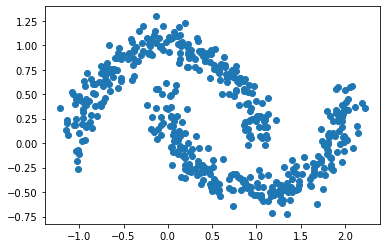

In [117]:
from sklearn.datasets import make_moons
import matplotlib.pyplot as plt
import pandas as pd

X, _ = make_moons(n_samples=500, noise=0.1)
plt.scatter(X[:,0], X[:,1])
plt.show()

Кластеризуйте это с помощью своей версии DBSCAN:

In [ ]:
# your code here


Референс:

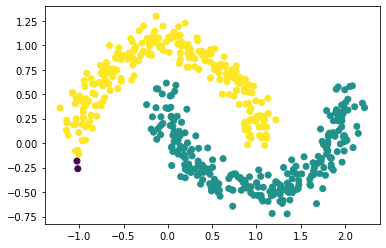

In [118]:
from sklearn.cluster import DBSCAN

clusters = DBSCAN(eps=0.2, min_samples=10).fit_predict(X)

plt.scatter(X[:,0], X[:,1], c=clusters)
plt.show()


> Получите 1 балл за ещё один интересный пример кластеризации (в качестве референса используйте предоставленное изображение. Нужно несколько интересных соседствующих форм):



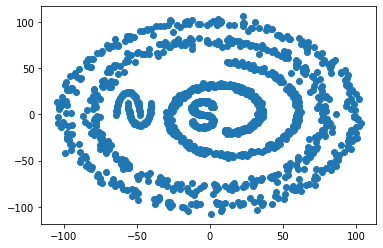

In [ ]:
# your code here


Или хотя бы что-нибудь такое: 

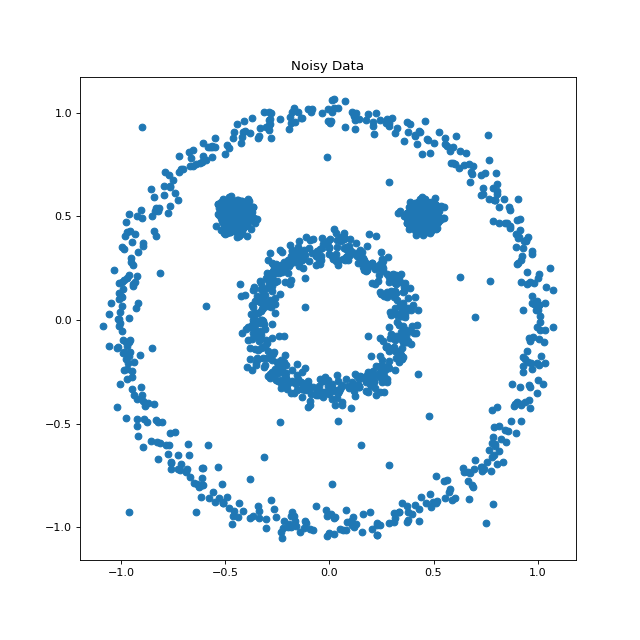

In [ ]:
# your code here



> Получите ещё 1 балл, если время работы вашего алгоритма больше референсного не более чем в 100 раз с учётом погрешности 3% от вашего времени:



In [ ]:
%%time
%%capture
clusters = DBSCAN(eps=0.2, min_samples=10).fit_predict(X)

In [ ]:
%%time
%%capture
clusters = dbscan(eps=0.2, min_samples=10).fit_predict(X)

## Применяем DBSCAN (3 балла)

__[1.5 балла]__ Возьмите колонки `Distance` и `DepTime` (из датасета о задержках самолётов). Запустите на тренировочной выборке на них DBSCAN. Нарисуйте облоко рассеивания с получившимися кластерами. Насколько много их вышло? 

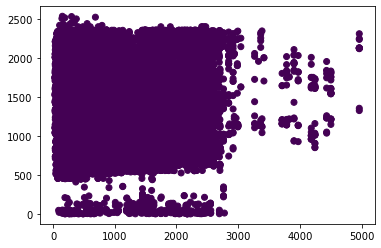

[-1 -1 -1 ... -1 -1 -1]


In [142]:
# your code here  ლ(ಠ益ಠლ)
data = train[['Distance', 'DepTime']].values
cluster =  DBSCAN(eps=0.2, min_samples=10).fit_predict(data)
plt.scatter(data[:,0], data[:,1], c=cluster)
plt.show()

Попробуйте перебрать параметры `eps` и `min_samples` по решётке и нарисовать для каждой пары облако рассеивания. При каких параметрах шумовых точек оказывается больше всего? Почему так происходит? 

__Ответ:__ 

min_samples = 10, eps = 0.2


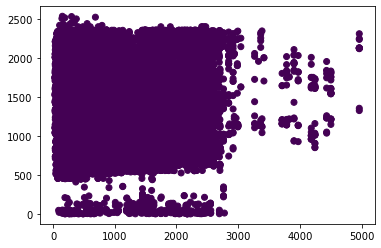

min_samples = 5, eps = 0.2


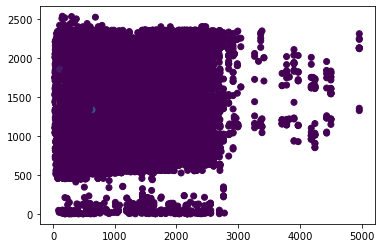

min_samples = 3, eps = 0.2


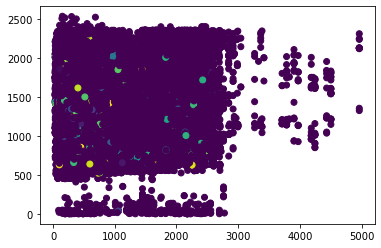

min_samples = 15, eps = 0.2


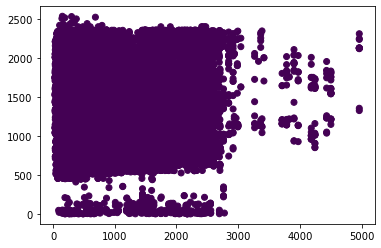

min_samples = 2, eps = 0.2


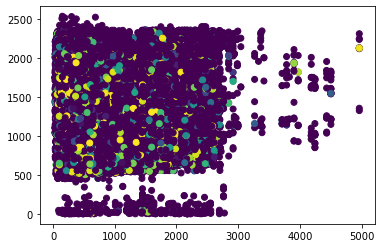

min_samples = 10, eps = 0.3


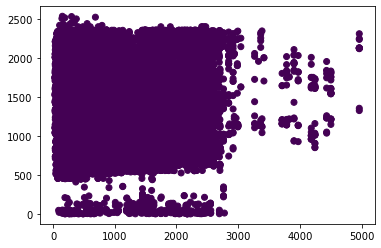

min_samples = 5, eps = 0.3


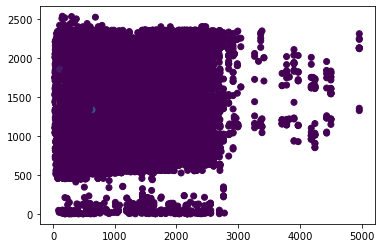

min_samples = 3, eps = 0.3


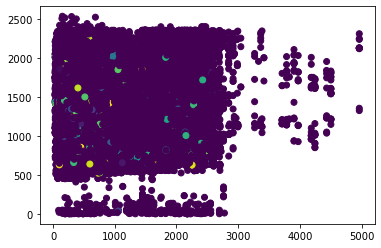

min_samples = 15, eps = 0.3


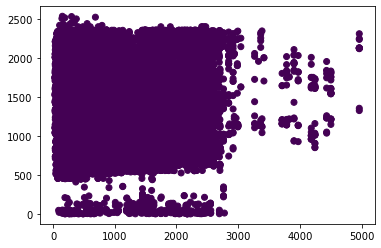

min_samples = 2, eps = 0.3


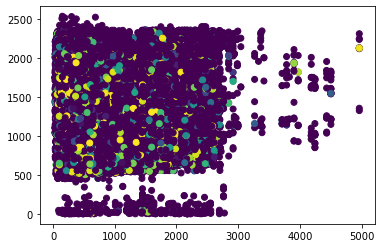

min_samples = 10, eps = 0.6


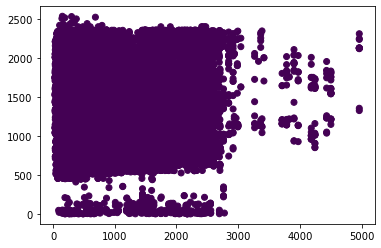

min_samples = 5, eps = 0.6


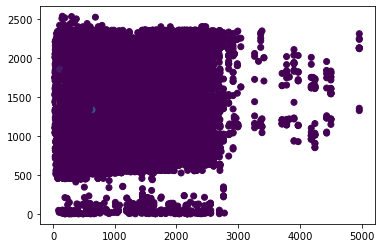

min_samples = 3, eps = 0.6


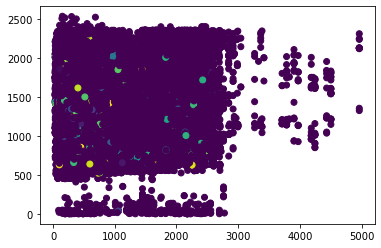

min_samples = 15, eps = 0.6


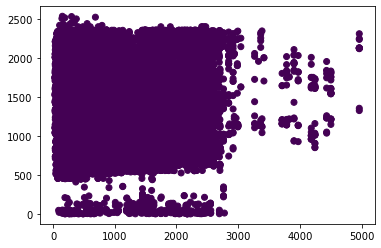

min_samples = 2, eps = 0.6


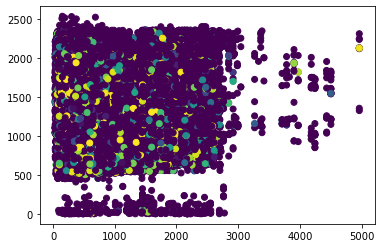

min_samples = 10, eps = 0.9


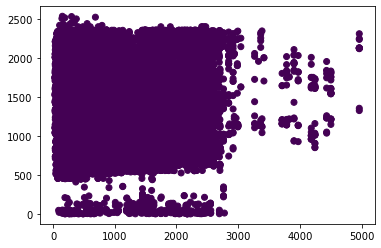

min_samples = 5, eps = 0.9


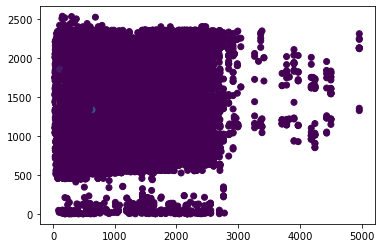

min_samples = 3, eps = 0.9


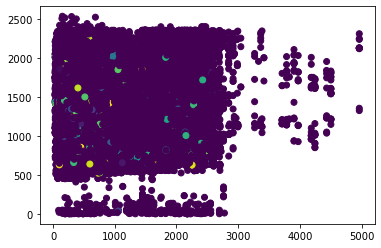

min_samples = 15, eps = 0.9


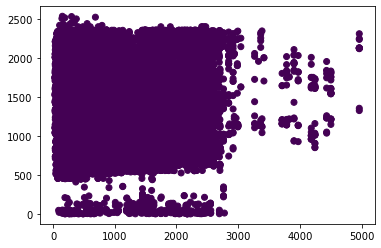

min_samples = 2, eps = 0.9


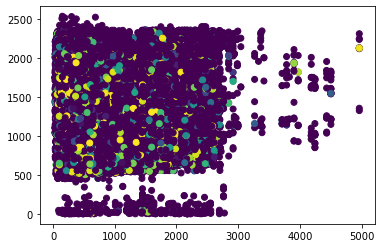

In [128]:
# your code here   ⟅⎛ꌩωꌩ⎞⟆
eps = [0.2, 0.3, 0.6, 0.9]
min_samples = [10, 5, 3, 15, 2]
for i in eps:
    for j in min_samples:
        cluster =  DBSCAN(eps=i, min_samples=j).fit_predict(data)
        print(f"min_samples = {j}, eps = {i}")
        plt.scatter(data[:,0], data[:,1], c=cluster)
        plt.show()


__[1.5 балла]__ Добавьте в датасет новую категориальную переменную: номер кластера из DBSCAN и обучите Catboost со своими лучшими гиперпараметрами. Улучшилось ли качество модели на тестовой выборке? Как думаете, почему? 

In [152]:
# your code here  ¯\_(ツ)_/¯
cluster =  DBSCAN(eps=0.2, min_samples=2).fit_predict(data)
X_train = pd.concat([X_train, pd.DataFrame(cluster.reshape(cluster.shape[0], 1))], axis = 1)
X_train_part, X_valid, y_train_part, y_valid = train_test_split(X_train, y_train, test_size=0.3)
cat.fit(X_train_part, y_train_part)
print(roc_auc_score(y_valid, cat.predict_proba(X_valid)[:, 1]))

Learning rate set to 0.063211
0:	learn: 0.6591786	total: 361ms	remaining: 6m
1:	learn: 0.6294273	total: 404ms	remaining: 3m 21s
2:	learn: 0.6051984	total: 546ms	remaining: 3m 1s
3:	learn: 0.5831374	total: 560ms	remaining: 2m 19s
4:	learn: 0.5646204	total: 573ms	remaining: 1m 54s
5:	learn: 0.5485231	total: 587ms	remaining: 1m 37s
6:	learn: 0.5359912	total: 601ms	remaining: 1m 25s
7:	learn: 0.5253379	total: 611ms	remaining: 1m 15s
8:	learn: 0.5148569	total: 622ms	remaining: 1m 8s
9:	learn: 0.5060809	total: 634ms	remaining: 1m 2s
10:	learn: 0.4987092	total: 644ms	remaining: 57.9s
11:	learn: 0.4917466	total: 653ms	remaining: 53.8s
12:	learn: 0.4863559	total: 664ms	remaining: 50.4s
13:	learn: 0.4818414	total: 673ms	remaining: 47.4s
14:	learn: 0.4775332	total: 683ms	remaining: 44.8s
15:	learn: 0.4728859	total: 694ms	remaining: 42.7s
16:	learn: 0.4694267	total: 704ms	remaining: 40.7s
17:	learn: 0.4667868	total: 714ms	remaining: 39s
18:	learn: 0.4641150	total: 726ms	remaining: 37.5s
19:	learn:

Качество улучшилось потому что появился новый информативый признак 

__Ответ:__

# Небольшие подарочки

**+0.1 балла** за фотографию того, как вы проводите лето на открытом воздухе

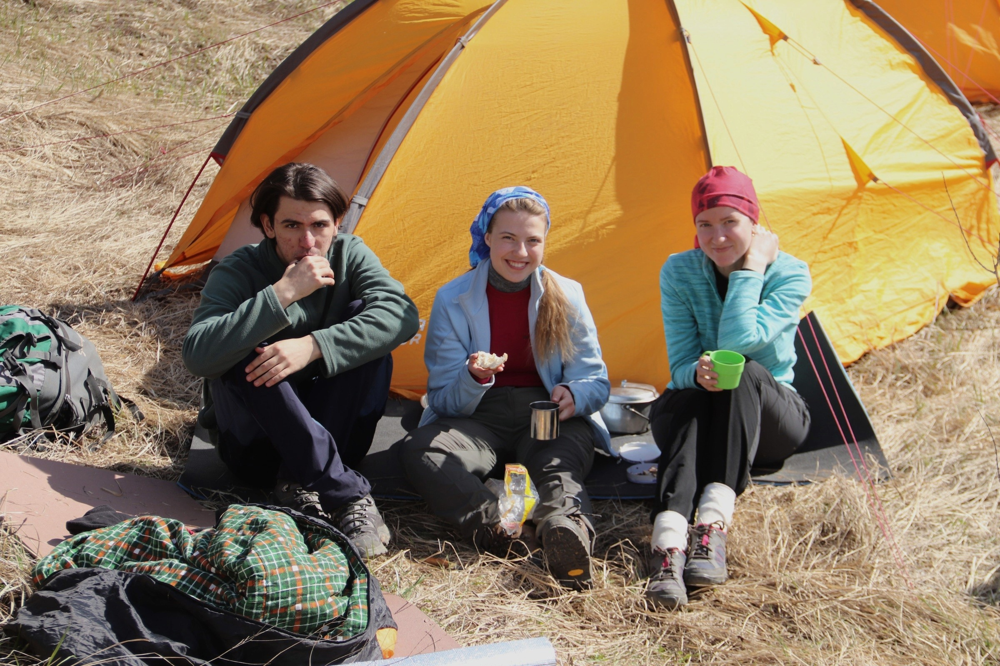

**+0.1 балла** за смешной мем по машинному обучению

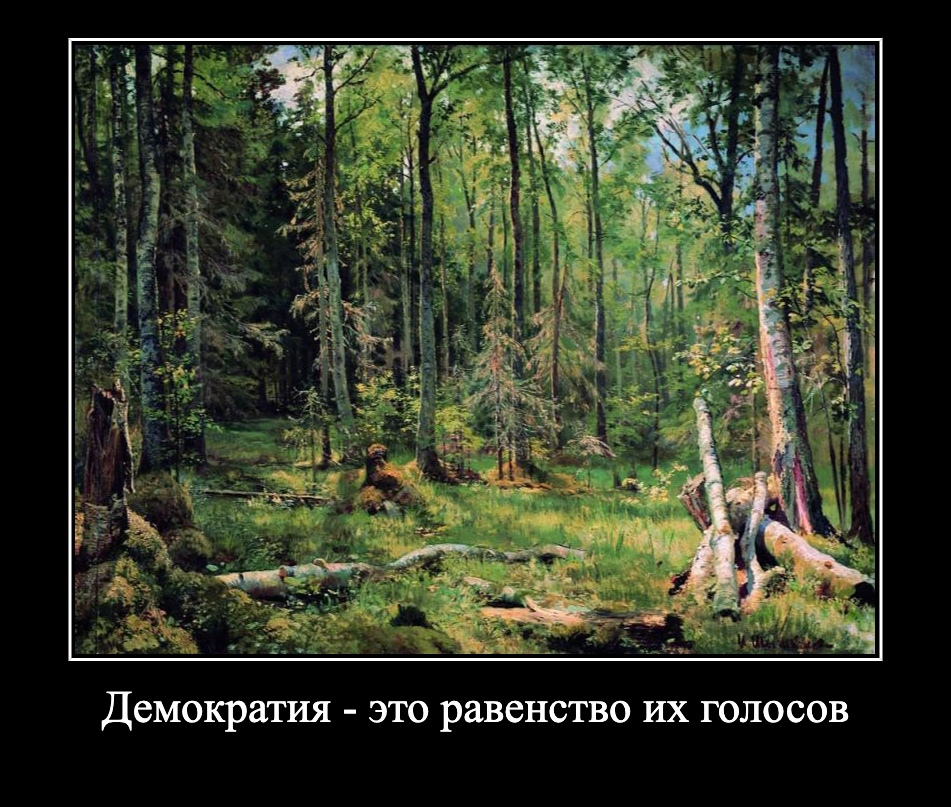

**+0.1 балла** за развернутый отзыв о курсе: ваших впечатлениях, сложностях и радостях, любимых темах и т.д.